# Perform EDA on the sampled docket data

```
\COPY (SELECT
  d.*,
  de.*,
  rd.*,
  c.*
FROM (
    SELECT
      id AS docket_id,
      date_created AS docket_date_created,
      case_name_short AS docket_case_name_short,
      case_name AS docket_case_name,
      case_name_full AS docket_case_name_full,
      slug AS docket_slug,
      docket_number,
      blocked,
      court_id AS docket_court_id,
      assigned_to_id,
      assigned_to_str,
      cause,
      date_filed,
      date_last_filing,
      date_terminated,
      jurisdiction_type,
      jury_demand,
      nature_of_suit,
      pacer_case_id AS docket_pacer_case_id,
      appeal_from_id,
      appeal_from_str,
      appellate_case_type_information,
      originating_court_information_id,
      docket_number_core,
      idb_data_id,
      parent_docket_id
     FROM search_docket
     TABLESAMPLE BERNOULLI(0.002)
) AS d
LEFT JOIN (
    SELECT
      id AS docket_entry_id,
      date_created AS docket_entry_date_created,
      entry_number,
      description,
      docket_id AS docket_entry_docket_id,
      pacer_sequence_number,
      recap_sequence_number
    FROM search_docketentry
) AS de ON de.docket_entry_docket_id = d.docket_id
LEFT JOIN (
    SELECT
      id AS court_id,
      in_use,
      position,
      citation_string,
      short_name AS court_short_name,
      full_name AS court_full_name,
      jurisdiction AS court_jurisdiction,
      pacer_court_id,
      fjc_court_id,
      parent_court_id
    FROM search_court
) AS c ON d.docket_court_id = c.court_id
LEFT JOIN (
    SELECT
      id AS recap_document_id,
      date_created AS recap_date_created,
      document_type AS recap_document_type,
      document_number AS recap_document_number,
      attachment_number AS recap_attachment_number,
      pacer_doc_id AS recap_pacer_doc_id,
      is_available,
      docket_entry_id AS recap_docket_entry_id,
      description AS recap_description,
      ocr_status,
      plain_text,
      page_count
    FROM search_recapdocument
) AS rd ON rd.recap_docket_entry_id = de.docket_entry_id) to '/tmp/dockets.csv' CSV HEADER;
```

# Import libaries

In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Load the data

In [2]:
df = pd.read_csv("data/dockets.csv")

# Remove dockets that don't have any docket entries in RECAP

In [3]:
df = df[~df["docket_entry_id"].isna()]
df

,docket_id,docket_date_created,docket_case_name_short,docket_case_name,docket_case_name_full,docket_slug,docket_number,blocked,docket_court_id,assigned_to_id,...,court_id,in_use,position,citation_string,court_short_name,court_full_name,court_jurisdiction,pacer_court_id,fjc_court_id,parent_court_id
8,66759071,2023-01-25 21:02:25.868185+00,NaN,"Belfor USA Group, Inc. v. Promesa Apartments, ...",NaN,belfor-usa-group-inc-v-promesa-apartments-ltd,1:23-cv-00078,f,txwd,NaN,...,txwd,t,251.0,W.D. Tex.,W.D. Texas,"District Court, W.D. Texas",FD,181.0,42,usdistct
9,66759071,2023-01-25 21:02:25.868185+00,NaN,"Belfor USA Group, Inc. v. Promesa Apartments, ...",NaN,belfor-usa-group-inc-v-promesa-apartments-ltd,1:23-cv-00078,f,txwd,NaN,...,txwd,t,251.0,W.D. Tex.,W.D. Texas,"District Court, W.D. Texas",FD,181.0,42,usdistct
10,66759071,2023-01-25 21:02:25.868185+00,NaN,"Belfor USA Group, Inc. v. Promesa Apartments, ...",NaN,belfor-usa-group-inc-v-promesa-apartments-ltd,1:23-cv-00078,f,txwd,NaN,...,txwd,t,251.0,W.D. Tex.,W.D. Texas,"District Court, W.D. Texas",FD,181.0,42,usdistct
11,66759071,2023-01-25 21:02:25.868185+00,NaN,"Belfor USA Group, Inc. v. Promesa Apartments, ...",NaN,belfor-usa-group-inc-v-promesa-apartments-ltd,1:23-cv-00078,f,txwd,NaN,...,txwd,t,251.0,W.D. Tex.,W.D. Texas,"District Court, W.D. Texas",FD,181.0,42,usdistct
12,66759071,2023-01-25 21:02:25.868185+00,NaN,"Belfor USA Group, Inc. v. Promesa Apartments, ...",NaN,belfor-usa-group-inc-v-promesa-apartments-ltd,1:23-cv-00078,f,txwd,NaN,...,txwd,t,251.0,W.D. Tex.,W.D. Texas,"District Court, W.D. Texas",FD,181.0,42,usdistct
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9222,4531126,2016-11-15 12:20:07.482326+00,NaN,"Blue Spike, LLC v. Media Science Incorporated",NaN,blue-spike-llc-v-media-science-incorporated,2:16-cv-00701,f,txed,2872.0,...,txed,t,250.0,E.D. Tex.,E.D. Texas,"District Court, E.D. Texas",FD,175.0,40,usdistct
9223,4531126,2016-11-15 12:20:07.482326+00,NaN,"Blue Spike, LLC v. Media Science Incorporated",NaN,blue-spike-llc-v-media-science-incorporated,2:16-cv-00701,f,txed,2872.0,...,txed,t,250.0,E.D. Tex.,E.D. Texas,"District Court, E.D. Texas",FD,175.0,40,usdistct
9224,4531126,2016-11-15 12:20:07.482326+00,NaN,"Blue Spike, LLC v. Media Science Incorporated",NaN,blue-spike-llc-v-media-science-incorporated,2:16-cv-00701,f,txed,2872.0,...,txed,t,250.0,E.D. Tex.,E.D. Texas,"District Court, E.D. Texas",FD,175.0,40,usdistct
9225,4531126,2016-11-15 12:20:07.482326+00,NaN,"Blue Spike, LLC v. Media Science Incorporated",NaN,blue-spike-llc-v-media-science-incorporated,2:16-cv-00701,f,txed,2872.0,...,txed,t,250.0,E.D. Tex.,E.D. Texas,"District Court, E.D. Texas",FD,175.0,40,usdistct


# Clean up the date columns

In [4]:
for col in df.select_dtypes(include=['object']).columns:
    try:
        df[col] = pd.to_datetime(df[col])
        print(f"Converted {col} to datetime.")
    except:
        continue

Converted docket_date_created to datetime.
Converted docket_case_name_full to datetime.
Converted date_filed to datetime.
Converted date_last_filing to datetime.
Converted date_terminated to datetime.
Converted recap_date_created to datetime.


/var/folders/rx/3t2jtk8j69j_db_cydq_v6wc0000gn/T/ipykernel_45013/3405962496.py:3: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df[col] = pd.to_datetime(df[col])
/var/folders/rx/3t2jtk8j69j_db_cydq_v6wc0000gn/T/ipykernel_45013/3405962496.py:3: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df[col] = pd.to_datetime(df[col])
/var/folders/rx/3t2jtk8j69j_db_cydq_v6wc0000gn/T/ipykernel_45013/3405962496.py:3: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df[col] = pd.to_datetime(df[col])
/var/folders/rx/3t2jtk8j69j_db_cydq_v6wc0000gn/T/ipykernel_45013/3405962496.py:3: UserWarning:

In [5]:
df['docket_year_created'] = df['docket_date_created'].dt.year

# Use the court_short_name column to extract the state

In [6]:
df['court_state'] = df['court_short_name'].str.extract(r'(?:\.\s*|^)([A-Za-z\s]+)$')

# Take a look at some stats

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8209 entries, 8 to 9226
Data columns (total 57 columns):
 #   Column                            Non-Null Count  Dtype              
---  ------                            --------------  -----              
 0   docket_id                         8209 non-null   int64              
 1   docket_date_created               8209 non-null   datetime64[ns, UTC]
 2   docket_case_name_short            5743 non-null   object             
 3   docket_case_name                  8178 non-null   object             
 4   docket_case_name_full             0 non-null      datetime64[ns]     
 5   docket_slug                       8178 non-null   object             
 6   docket_number                     8209 non-null   object             
 7   blocked                           8209 non-null   object             
 8   docket_court_id                   8209 non-null   object             
 9   assigned_to_id                    5001 non-null   float64           

In [8]:
for col in df.columns:
    print(f"{col}: {df[col].nunique()}")

docket_id: 339
docket_date_created: 339
docket_case_name_short: 253
docket_case_name: 336
docket_case_name_full: 0
docket_slug: 336
docket_number: 339
blocked: 2
docket_court_id: 129
assigned_to_id: 183
assigned_to_str: 197
cause: 43
date_filed: 327
date_last_filing: 328
date_terminated: 256
jurisdiction_type: 8
jury_demand: 3
nature_of_suit: 53
docket_pacer_case_id: 337
appeal_from_id: 1
appeal_from_str: 1
appellate_case_type_information: 1
originating_court_information_id: 1
docket_number_core: 335
idb_data_id: 67
parent_docket_id: 0
docket_entry_id: 8142
docket_entry_date_created: 8142
entry_number: 341
description: 2158
docket_entry_docket_id: 339
pacer_sequence_number: 626
recap_sequence_number: 4456
recap_document_id: 8209
recap_date_created: 8209
recap_document_type: 2
recap_document_number: 341
recap_attachment_number: 5
recap_pacer_doc_id: 6055
is_available: 2
recap_docket_entry_id: 8142
recap_description: 2634
ocr_status: 3
plain_text: 205
page_count: 46
court_id: 129
in_use:

# Take a look at some categorical columns

In [9]:
categoricals = ["blocked", "cause", "jurisdiction_type", "nature_of_suit", 
                "recap_document_type", "is_available", "ocr_status", "court_id", "court_state",
                 "court_short_name", "court_full_name", "court_jurisdiction", "docket_year_created"]

In [10]:
for col in categoricals:
    print("-----")
    print(df[col].value_counts().sort_index())

-----
blocked
f    2843
t    5366
Name: count, dtype: int64
-----
cause
12:22 Securities Fraud                                                    9
12:635 Breach of Insurance Contract                                       1
15:1681 Fair Credit Reporting Act                                        16
15:1692 Fair Debt Collection Act                                         26
15:1938 Fair Labor Standards Act                                         22
15:78 Securities Exchange Act                                           135
15:78m(a) Securities Exchange Act                                        51
18:1961 Racketeering (RICO) Act                                         124
28:1331 Fed. Question: Fair Labor Standards                              35
28:1331 Fed. Question: Personal Injury                                   30
28:1331 Federal Question                                                 18
28:1332 Diversity-Insurance Contract                                      8
28:1332 Diversit

# Clean up some categorical columns

In [11]:
df["jurisdiction_type"] = df["jurisdiction_type"].replace("Local question", "Local Question").replace("Federal question", "Federal Question").replace("Federal Question 管辖权：联邦问题", "Federal Question").replace("Federal Question 管辖权： 联邦问题", "Federal Question").replace("Government defendant", "Government Defendant").replace("U.S. Government Defendant", "Government Defendant").replace("Government plaintiff", "Government Plaintiff").replace("U.S. Government Plaintiff", "Government Plaintiff").replace("0", "NaN").replace("6", "NaN").replace("5", "NaN").replace("Diversity of citizenship", "Diversity")
df["nature_of_suit"] = df["nature_of_suit"].replace('360 P.I.: Other', '360 Other personal liability').replace('442 Civil Rights: Jobs', '442 Civil Rights: Employment').replace('442 Civil rights jobs', '442 Civil Rights: Employment').replace('446 Civil Rights: Americans with Disabilities - Other', '446 Civil rights ADA other').replace('791 Employee Retirement Income Security Act', '791 Labor: Employee Retirement Income Security Act (ERISA)').replace('830 Patent Infringement (Fed. Question)', '830 Patent').replace('850 Other Statutes: Securities/Commodities', '850 Securities/Commodities').replace('850 Securities, Commodities, Exchange', '850 Securities/Commodities').replace('365 Personal Inj. Prod. Liability', '365 Personal injury - Product liability').replace("Civil Rights: Jobs", "442 Civil Rights: Employment").replace("Civil Rights: Other", "440 Civil rights other").replace("Contract - (Post Award) Injunction", "190 Contract: Other").replace("Contract: Other", "190 Contract: Other").replace("Insurance", "110 Insurance").replace("Insurance", "110 Insurance").replace("P.I.: Other", "360 Other personal liability").replace("Prisoner: Civil Rights", "550 Prisoner: Civil Rights").replace("Prop. Damage Prod. Liability", "385 Prop. Damage Prod. Liability")
df["cause"] = df["cause"].replace("15:78m(a) Securities Exchange Act", "15:78 Securities Exchange Act").replace('28:1331 Fed. Question: Fair Labor Standards', '28:1331 Federal Question').replace('28:1331 Fed. Question: Personal Injury', '28:1331 Federal Question').replace('28:1332 Diversity-Insurance Contract', '28:1332 Diversity').replace('28:1332 Diversity-Other Contract', '28:1332 Diversity').replace('28:1332 Diversity-Personal Injury', '28:1332 Diversity').replace('28:1332 Diversity-Petition for Removal', '28:1332 Diversity').replace('28:1332 Diversity-Product Liability', '28:1332 Diversity').replace('28:1332pi Diversity-Personal Injury', '28:1332 Diversity').replace("28:1441 Notice of Removal", "28:1441 Petition for Removal").replace("28:1441 Petition for Removal- Breach of Contract", "28:1441 Petition for Removal").replace("42:2000e  Job Discrimination (Employment)", "42:2000e Job Discrimination (Employment)").replace('42:405 Review of Social Security Decision (DIWC)', '42:405 Review of HHS Decision (DIWC)').replace('42:1983 Civil Rights Act', '42:1983 Prisoner Civil Rights').replace('42:1983 Prisoner Civil Rights, State Filers', '42:1983 Prisoner Civil Rights').replace('42:2000e Job Discrimination (Employment)', '42:2000e Job Discrimination').replace('42:2000 Job Discrimination (Race)', '42:2000e Job Discrimination')

In [12]:
for col in categoricals:
    print("-----")
    print(df[col].value_counts().sort_index())

-----
blocked
f    2843
t    5366
Name: count, dtype: int64
-----
cause
12:22 Securities Fraud                                                    9
12:635 Breach of Insurance Contract                                       1
15:1681 Fair Credit Reporting Act                                        16
15:1692 Fair Debt Collection Act                                         26
15:1938 Fair Labor Standards Act                                         22
15:78 Securities Exchange Act                                           186
18:1961 Racketeering (RICO) Act                                         124
28:1331 Federal Question                                                 83
28:1332 Diversity                                                       235
28:1345 Default of Student Loan                                          20
28:1441 Petition for Removal                                              5
28:1491 Tucker Act                                                        1
28:2241 Petition

## Confirm no empty descriptions

In [13]:
assert len(df[(df["description"].isna()) & (df["recap_description"].isna()) & (df["plain_text"].isna())]) == 0

# Visualize distributions

In [14]:
def plot_cat(cat_col, title, xlabel, ylabel="Count", size=(18, 6), rotation=90, data=df):
    plt.figure(figsize=size)
    sorted_data = data.sort_values(by=cat_col)
    sns.countplot(data=sorted_data, x=cat_col)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.xticks(rotation=rotation)
    plt.show()

In [15]:
column_info = [
    {"col_name": "blocked", "title": "Blocked Status Distribution", "xlabel": "Blocked"},
    {"col_name": "cause", "title": "Cause Distribution", "xlabel": "Cause"},
    {"col_name": "jurisdiction_type", "title": "Jurisdiction Type Distribution", "xlabel": "Jurisdiction Type"},
    {"col_name": "nature_of_suit", "title": "Nature of Suit Distribution", "xlabel": "Nature of Suit"},
    {"col_name": "recap_document_type", "title": "Recap Document Type Distribution", "xlabel": "Document Type"},
    {"col_name": "is_available", "title": "Availability Status Distribution", "xlabel": "Is Available"},
    {"col_name": "ocr_status", "title": "OCR Status Distribution", "xlabel": "OCR Status"},
    {"col_name": "court_id", "title": "Court ID Distribution", "xlabel": "Court ID"},
    {"col_name": "court_state", "title": "Court State Distribution", "xlabel": "Court State"},
    {"col_name": "court_short_name", "title": "Court Short Name Distribution", "xlabel": "Court Short Name"},
    {"col_name": "court_full_name", "title": "Court Full Name Distribution", "xlabel": "Court Full Name"},
    {"col_name": "court_jurisdiction", "title": "Court Jurisdiction Distribution", "xlabel": "Court Jurisdiction"},
    {"col_name": "docket_year_created", "title": "Docket Year Created Distribution", "xlabel": "Year Created"}
]

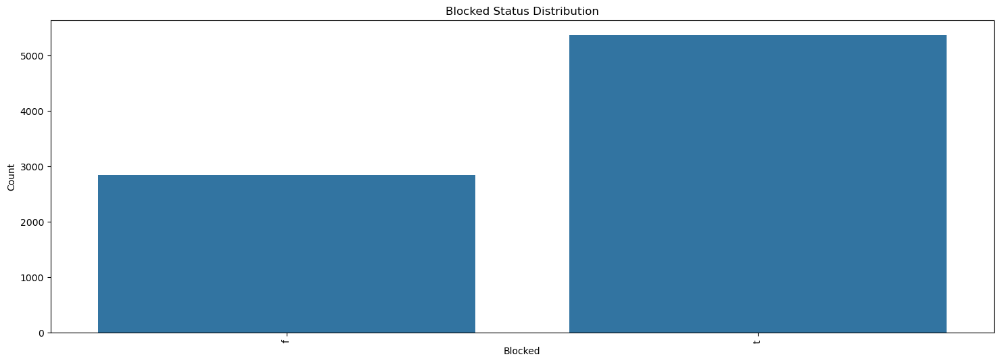

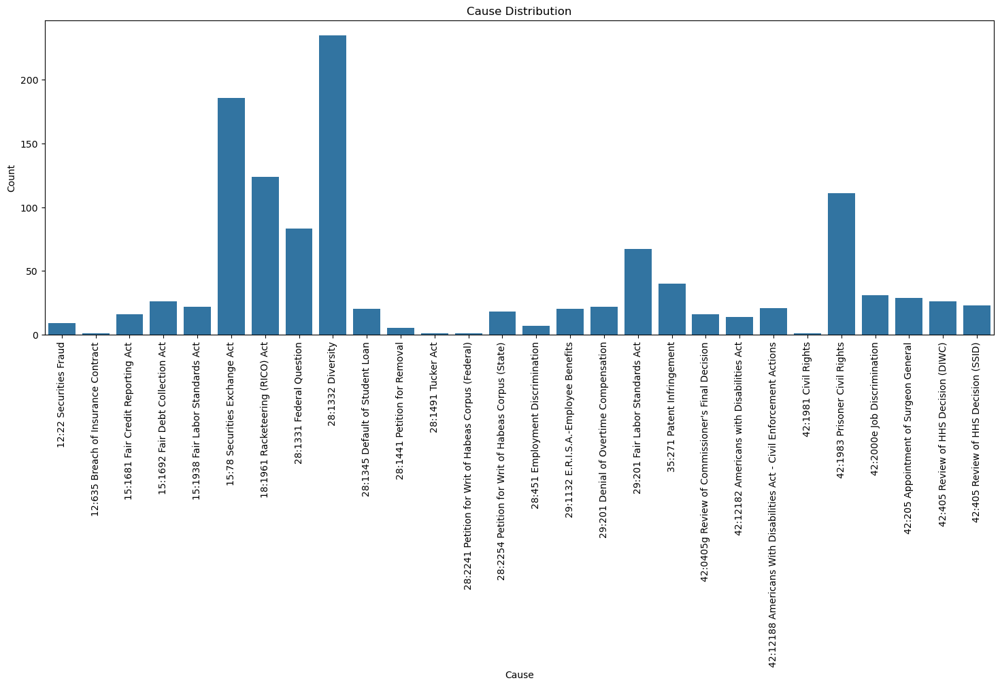

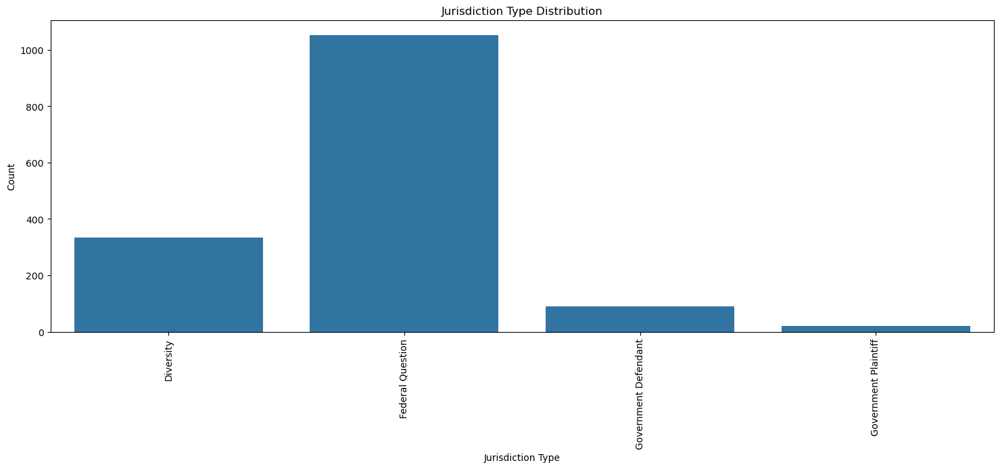

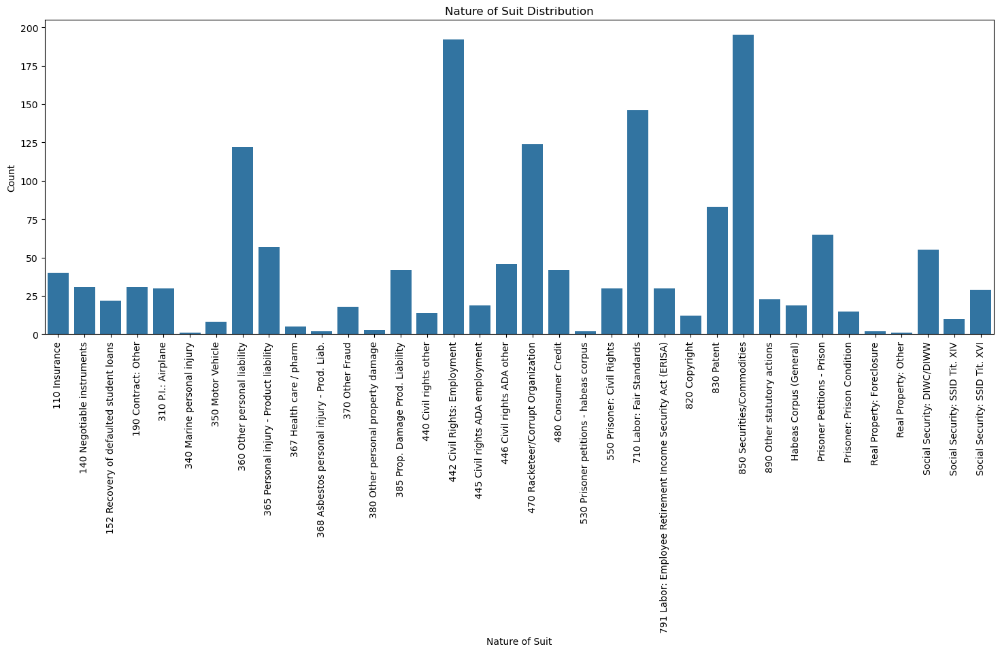

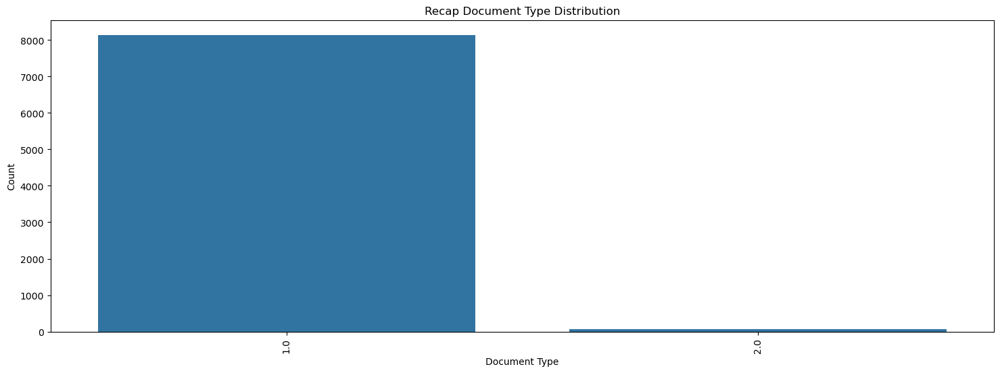

...

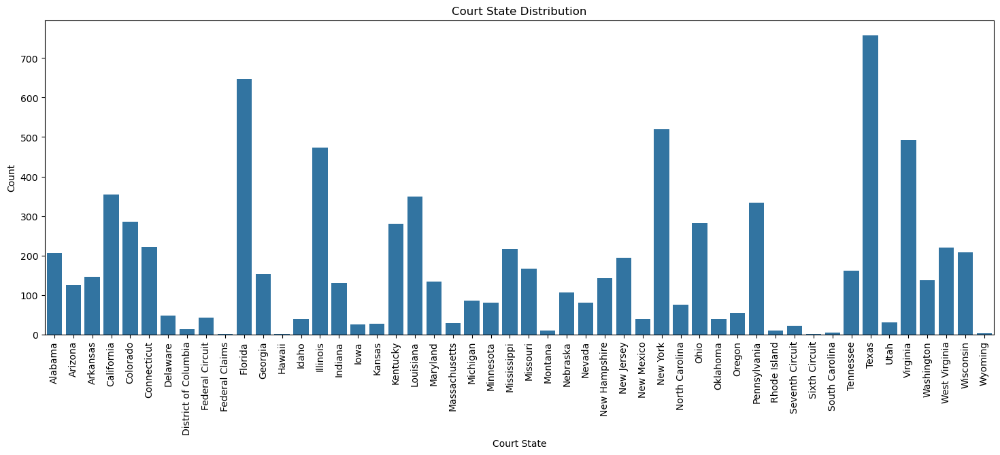

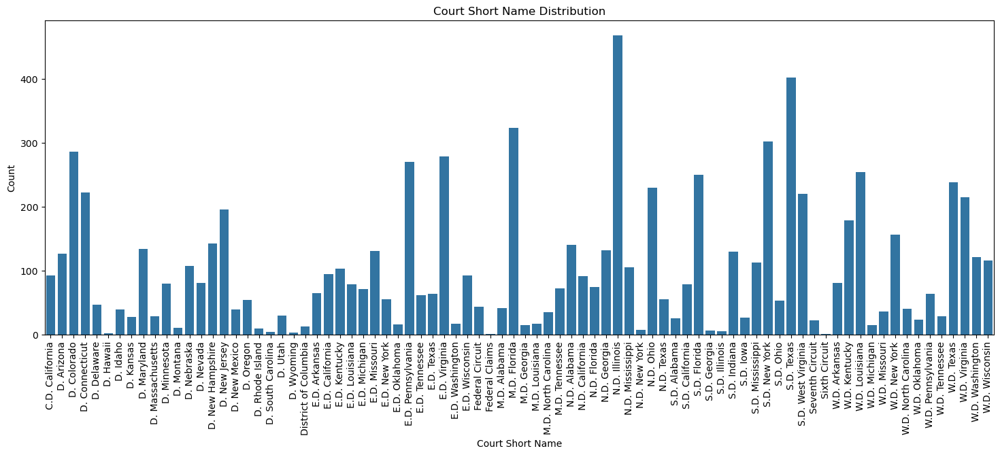

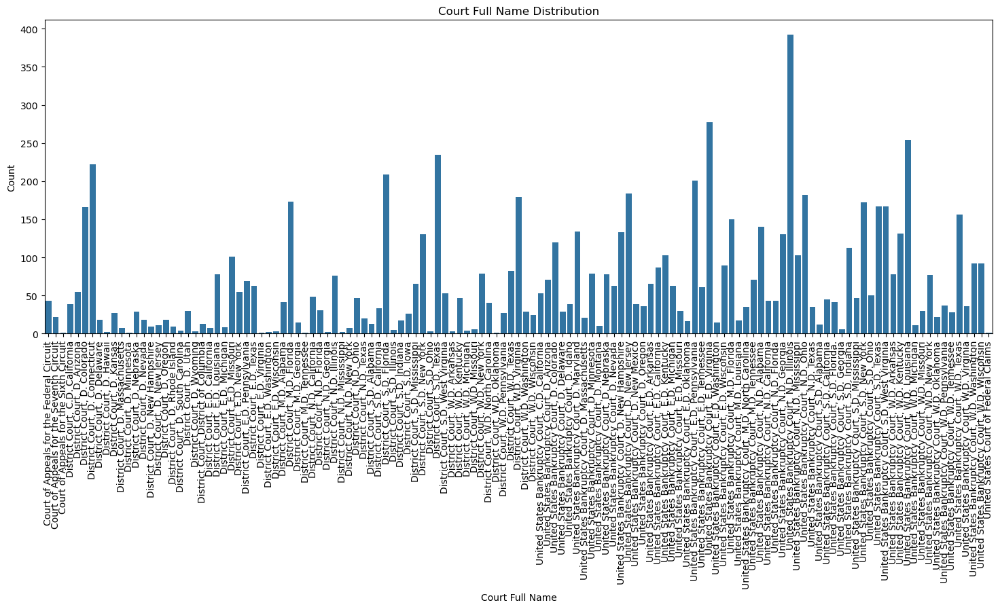

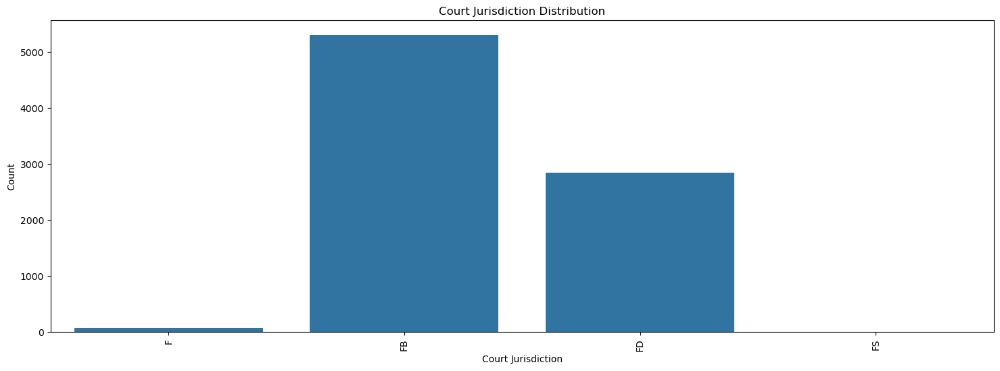

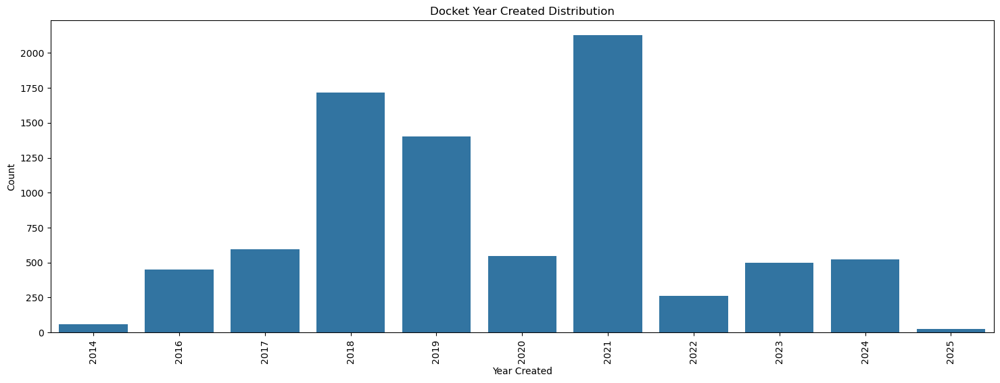

In [16]:
for each in column_info:
    plot_cat(each["col_name"], each["title"], each["xlabel"])

In [19]:
# Group by state and year, then count occurrences
grouped = df.groupby(['court_state', 'docket_year_created']).size().reset_index(name='count')
grouped = grouped.sort_values(by=['docket_year_created'])

# To map state names correctly, convert them to abbreviations using a predefined map
state_abbreviations = {
    'Alabama': 'AL', 'Alaska': 'AK', 'Arizona': 'AZ', 'Arkansas': 'AR', 
    'California': 'CA', 'Colorado': 'CO', 'Connecticut': 'CT', 'Delaware': 'DE', 
    'District of Columbia': 'DC', 'Florida': 'FL', 'Georgia': 'GA', 'Hawaii': 'HI', 
    'Idaho': 'ID', 'Illinois': 'IL', 'Indiana': 'IN', 'Iowa': 'IA', 
    'Kansas': 'KS', 'Kentucky': 'KY', 'Louisiana': 'LA', 'Maine': 'ME', 
    'Maryland': 'MD', 'Massachusetts': 'MA', 'Michigan': 'MI', 'Minnesota': 'MN', 
    'Mississippi': 'MS', 'Missouri': 'MO', 'Montana': 'MT', 'Nebraska': 'NE', 
    'Nevada': 'NV', 'New Hampshire': 'NH', 'New Jersey': 'NJ', 'New Mexico': 'NM', 
    'New York': 'NY', 'North Carolina': 'NC', 'North Dakota': 'ND', 'Ohio': 'OH', 
    'Oklahoma': 'OK', 'Oregon': 'OR', 'Pennsylvania': 'PA', 'Rhode Island': 'RI', 
    'South Carolina': 'SC', 'South Dakota': 'SD', 'Tennessee': 'TN', 'Texas': 'TX', 
    'Utah': 'UT', 'Vermont': 'VT', 'Virginia': 'VA', 'Washington': 'WA', 
    'West Virginia': 'WV', 'Wisconsin': 'WI', 'Wyoming': 'WY'
}

# Map state names to abbreviations
grouped['state_abbr'] = grouped['court_state'].map(state_abbr)

# Find the maximum count for scaling
max_count = grouped['count'].max()

# Create a choropleth map
fig = px.choropleth(
    grouped,
    locations='state_abbr',
    locationmode='USA-states',
    color='count',
    hover_name='court_state',
    animation_frame='docket_year_created',
    scope='usa',
    color_continuous_scale='YlGnBu',
    title='Number of Cases by State and Year'
)

# Adjust the color scale to start from 0
fig.update_layout(
    coloraxis_colorbar=dict(title='Case Count'),
    coloraxis=dict(cmin=0, cmax=max_count),
    height=600,
    width=1000
)

fig.update_geos(showcoastlines=True, coastlinecolor="Black")
fig.show()

In [20]:
# Group by nature_of_suit and state, then count occurrences
grouped = df.groupby(['nature_of_suit', 'court_state']).size().reset_index(name='count')
grouped = grouped.sort_values(by=['nature_of_suit', 'court_state'])

# Map state names to abbreviations
grouped['state_abbr'] = grouped['court_state'].map(state_abbr)

# Find the maximum count for scaling
max_count = grouped['count'].max()

# Create a choropleth map
fig = px.choropleth(
    grouped,
    locations='state_abbr',
    locationmode='USA-states',
    color='count',
    hover_name='court_state',
    hover_data={'nature_of_suit': True, 'count': True},
    animation_frame='nature_of_suit',
    scope='usa',
    color_continuous_scale='YlGnBu',
    title='Number of Cases by State and Nature of Suit'
)

# Adjust the color scale to start from 0
fig.update_layout(
    coloraxis_colorbar=dict(title='Case Count'),
    coloraxis=dict(cmin=0, cmax=max_count),
    height=600,
    width=1000
)

fig.update_geos(showcoastlines=True, coastlinecolor="Black")
fig.show()
